<a href="https://colab.research.google.com/github/aqilahassan-hub/Multi-domain-Endoscopic-Surgeon-Action-Detection/blob/main/yolov6%20at%2012/10/22.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!git clone https://github.com/meituan/YOLOv6

Cloning into 'YOLOv6'...
remote: Enumerating objects: 2359, done.
remote: Counting objects: 100% (178/178), done.
remote: Compressing objects: 100% (119/119), done.
remote: Total 2359 (delta 73), reused 101 (delta 48), pack-reused 2181
Receiving objects: 100% (2359/2359), 28.61 MiB | 10.24 MiB/s, done.
Resolving deltas: 100% (1331/1331), done.


In [ ]:
%cd YOLOv6

/content/YOLOv6


In [ ]:
!pip install -r requirements.txt

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 13.1 MB 35.7 MB/s 
     |████████████████████████████████| 2.0 MB 55.0 MB/s 
     |████████████████████████████████| 237 kB 66.8 MB/s 
     |████████████████████████████████| 51 kB 7.4 MB/s 


In [ ]:
import torch
torch.cuda.is_available() 

True

In [31]:
import torch
torch.hub.download_url_to_file('https://github.com/meituan/YOLOv6/releases/download/0.2.0/yolov6s.pt', 'yolov6s.pt')

  0%|          | 0.00/36.3M [00:00<?, ?B/s]

In [38]:
!python tools/train.py --batch 16 --conf configs/yolov6s_finetune.py --data-path /content/YOLOv6/dataset.yaml --device 0 --epochs 10 --eval-interval 2

Using 1 GPU for training... 
training args are: Namespace(batch_size=16, calib=False, check_images=False, check_labels=False, conf_file='configs/yolov6s_finetune.py', data_path='/content/YOLOv6/dataset.yaml', device='0', dist_url='env://', distill=False, distill_feat=False, epochs=10, eval_final_only=False, eval_interval=2, gpu_count=0, heavy_eval_range=50, img_size=640, local_rank=-1, name='exp', output_dir='./runs/train', quant=False, rank=-1, resume=False, save_ckpt_on_last_n_epoch=-1, save_dir='runs/train/exp29', stop_aug_last_n_epoch=15, teacher_model_path=None, temperature=20, workers=8, world_size=1, write_trainbatch_tb=False)

Train: Final numbers of valid images: 87/ labels: 87. 
0.0s for dataset initialization.
Convert to COCO format
100% 36/36 [00:00<00:00, 75159.26it/s]
Convert to COCO format finished. Resutls saved in /content/YOLOv6/custom_datset/annotations/instances_val.json
Val: Final numbers of valid images: 36/ labels: 36. 
0.0s for dataset initialization.
Model: Mod

In [42]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [40]:
!python tools/infer.py --weights /content/YOLOv6/runs/train/exp29/weights/best_ckpt.pt --source /content/YOLOv6/custom_datset/images/train/real4_frame_2621.jpg --yaml /content/YOLOv6/dataset.yaml --device 0

Namespace(agnostic_nms=False, classes=None, conf_thres=0.4, device='0', half=False, hide_conf=False, hide_labels=False, img_size=[640, 640], iou_thres=0.45, max_det=1000, name='exp', project='runs/inference', save_dir=None, save_img=True, save_txt=False, source='/content/YOLOv6/custom_datset/images/train/real4_frame_2621.jpg', view_img=False, weights='/content/YOLOv6/runs/train/exp29/weights/best_ckpt.pt', yaml='/content/YOLOv6/dataset.yaml')
Save directory already existed
Loading checkpoint from /content/YOLOv6/runs/train/exp29/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
/usr/local/lib/python3.7/dist-packages/torch/functional.py:478: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2894.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
100% 1/1 [00:00<00:00, 19.99it/s]
Results saved to runs/inference/exp


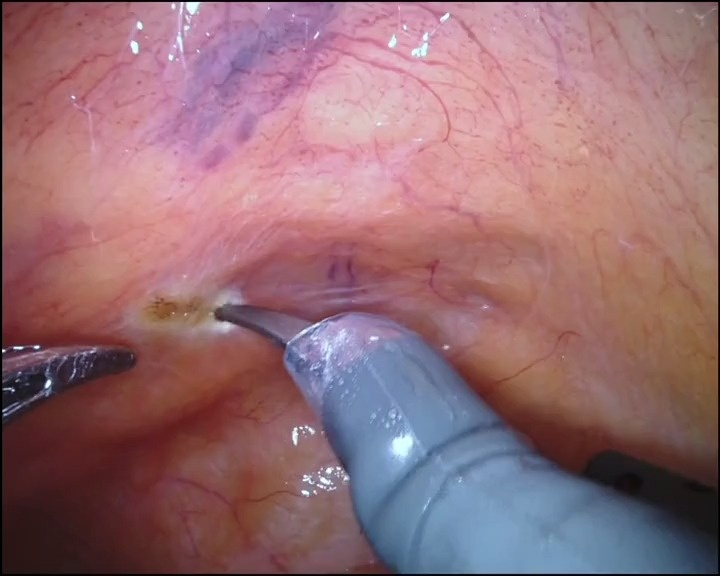

In [41]:
from IPython.display import Image #this is to render predictions
Image(filename='/content/YOLOv6/runs/inference/exp/real4_frame_2621.jpg', width=1000)

In [43]:
!python tools/infer.py --weights /content/YOLOv6/runs/train/exp29/weights/best_ckpt.pt --source /content/YOLOv6/custom_datset/images/val/real3_frame_526.jpg --yaml /content/YOLOv6/dataset.yaml --device 0

Namespace(agnostic_nms=False, classes=None, conf_thres=0.4, device='0', half=False, hide_conf=False, hide_labels=False, img_size=[640, 640], iou_thres=0.45, max_det=1000, name='exp', project='runs/inference', save_dir=None, save_img=True, save_txt=False, source='/content/YOLOv6/custom_datset/images/val/real3_frame_526.jpg', view_img=False, weights='/content/YOLOv6/runs/train/exp29/weights/best_ckpt.pt', yaml='/content/YOLOv6/dataset.yaml')
Save directory already existed
Loading checkpoint from /content/YOLOv6/runs/train/exp29/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
/usr/local/lib/python3.7/dist-packages/torch/functional.py:478: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2894.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
100% 1/1 [00:00<00:00, 27.38it/s]
Results saved to runs/inference/exp


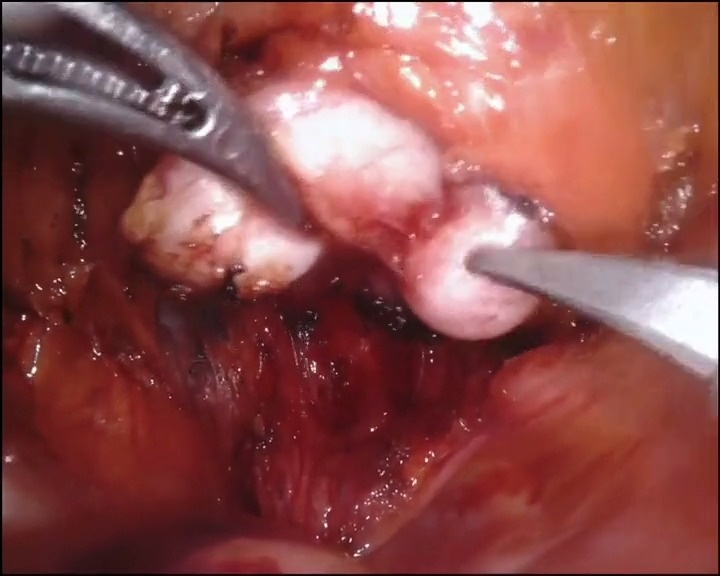

In [44]:
from IPython.display import Image #this is to render predictions
Image(filename='/content/YOLOv6/runs/inference/exp/real3_frame_526.jpg', width=1000)